<a href="https://colab.research.google.com/github/ORCsummer/MoANotebook/blob/main/MoA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Prep the environment**

Uninstall the version of xgboost that comes pre-imnstalled w/ colab (since it does not work with GPUs) and install the latest version provided (make sure the wheel is in the right rleative location). We also import a number of python libraries that come pre-installed. Most notable among these is tensrflow. Note that we do not import keras separately; the version that comes with tensorflow is what we need.  

In [ ]:
!pip uninstall xgboost
!pip install /content/drive/MyDrive/ColabData/xgboost-1.4.2-py3-none-manylinux2010_x86_64.whl

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import regularizers

from xgboost import XGBClassifier
import matplotlib.pyplot as plt

from sklearn.metrics import log_loss
from sklearn.multioutput import MultiOutputClassifier
from sklearn.model_selection import KFold
from sklearn.decomposition import PCA
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
from google.colab import data_table

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **Read in the data**

Two key files here: train_feature.csv (these is roughly your 'X'), and train_targets.csv (which is your 'y'). More information on these can be found on the original competetion site: https://www.kaggle.com/c/lish-moa/data 

In [ ]:
train_features = pd.read_csv('/content/drive/MyDrive/ColabData/MoA/train_features.csv')
train_targets = pd.read_csv('/content/drive/MyDrive/ColabData/MoA/train_targets_scored.csv')
print(train_features.head())
print(train_targets.head())

         sig_id cp_type  cp_time cp_dose  ...    c-96    c-97    c-98    c-99
0  id_000644bb2  trt_cp       24      D1  ... -0.3981  0.2139  0.3801  0.4176
1  id_000779bfc  trt_cp       72      D1  ...  0.1522  0.1241  0.6077  0.7371
2  id_000a6266a  trt_cp       48      D1  ... -0.6417 -0.2187 -1.4080  0.6931
3  id_0015fd391  trt_cp       48      D1  ... -1.6210 -0.8784 -0.3876 -0.8154
4  id_001626bd3  trt_cp       72      D2  ...  0.1094  0.2885 -0.3786  0.7125

[5 rows x 876 columns]
         sig_id  ...  wnt_inhibitor
0  id_000644bb2  ...              0
1  id_000779bfc  ...              0
2  id_000a6266a  ...              0
3  id_0015fd391  ...              0
4  id_001626bd3  ...              0

[5 rows x 207 columns]


Colab provides a handy javascript tool (data_table) to let you explore the data within the browser. For example: 

In [ ]:
#data_table.DataTable(train_features.sample(n=10,axis='columns'), include_index=False, num_rows_per_page=10, max_columns=10)
data_table.DataTable(train_features, include_index=False, num_rows_per_page=10, max_columns=10)

,sig_id,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,...,c-60,c-61,c-62,c-63,c-64,c-65,c-66,c-67,c-68,c-69,c-70,c-71,c-72,c-73,c-74,c-75,c-76,c-77,c-78,c-79,c-80,c-81,c-82,c-83,c-84,c-85,c-86,c-87,c-88,c-89,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
0,id_000644bb2,trt_cp,24,D1,1.0620,0.5577,-0.2479,-0.6208,-0.1944,-1.0120,-1.0220,-0.0326,0.5548,-0.0921,1.1830,0.1530,0.5574,-0.4015,0.1789,-0.6528,-0.7969,0.6342,0.1778,-0.3694,-0.5688,-1.1360,-1.1880,0.6940,0.4393,0.2664,0.1907,0.1628,-0.2853,0.5819,0.2934,-0.5584,-0.0916,-0.3010,-0.1537,0.2198,...,0.4805,0.4965,0.3680,0.8427,0.1042,0.1403,0.1758,1.2570,-0.5979,1.2250,-0.0553,0.7351,0.5810,0.9590,0.2427,0.0495,0.4141,0.8432,0.6162,-0.7318,1.2120,0.6362,-0.4427,0.1288,1.4840,0.1799,0.5367,-0.1111,-1.0120,0.6685,0.2862,0.2584,0.8076,0.5523,-0.1912,0.6584,-0.3981,0.2139,0.3801,0.4176
1,id_000779bfc,trt_cp,72,D1,0.0743,0.4087,0.2991,0.0604,1.0190,0.5207,0.2341,0.3372,-0.4047,0.8507,-1.1520,-0.4201,-0.0958,0.4590,0.0803,0.2250,0.5293,0.2839,-0.3494,0.2883,0.9449,-0.1646,-0.2657,-0.3372,0.3135,-0.4316,0.4773,0.2075,-0.4216,-0.1161,-0.0499,-0.2627,0.9959,-0.2483,0.2655,-0.2102,...,0.4083,0.0319,0.3905,0.7099,0.2912,0.4151,-0.2840,-0.3104,-0.6373,0.2887,-0.0765,0.2539,0.4443,0.5932,0.2031,0.7639,0.5499,-0.3322,-0.0977,0.4329,-0.2782,0.7827,0.5934,0.3402,0.1499,0.4420,0.9366,0.8193,-0.4236,0.3192,-0.4265,0.7543,0.4708,0.0230,0.2957,0.4899,0.1522,0.1241,0.6077,0.7371
2,id_000a6266a,trt_cp,48,D1,0.6280,0.5817,1.5540,-0.0764,-0.0323,1.2390,0.1715,0.2155,0.0065,1.2300,-0.4797,-0.5631,-0.0366,-1.8300,0.6057,-0.3278,0.6042,-0.3075,-0.1147,-0.0570,-0.0799,-0.8181,-1.5320,0.2307,0.4901,0.4780,-1.3970,4.6240,-0.0437,1.2870,-1.8530,0.6069,0.4290,0.1783,0.0018,-1.1800,...,-0.5477,-0.7576,-0.0444,0.1894,-0.0014,-2.3640,-0.4682,0.1210,-0.5177,-0.0604,0.1682,-0.4436,0.4963,0.1363,0.3335,0.9760,-0.0427,-0.1235,0.0959,0.0690,-0.9416,-0.7548,-0.1109,-0.6272,0.3019,0.1172,0.1093,-0.3113,0.3019,-0.0873,-0.7250,-0.6297,0.6103,0.0223,-1.3240,-0.3174,-0.6417,-0.2187,-1.4080,0.6931
3,id_0015fd391,trt_cp,48,D1,-0.5138,-0.2491,-0.2656,0.5288,4.0620,-0.8095,-1.9590,0.1792,-0.1321,-1.0600,-0.8269,-0.3584,-0.8511,-0.5844,-2.5690,0.8183,-0.0532,-0.8554,0.1160,-2.3520,2.1200,-1.1580,-0.7191,-0.8004,-1.4670,-0.0107,-0.8995,0.2406,-0.2479,-1.0890,-0.7575,0.0881,-2.7370,0.8745,0.5787,-1.6740,...,-2.1220,-0.3752,-2.3820,-3.7350,-2.9740,-1.4930,-1.6600,-3.1660,0.2816,-0.2990,-1.1870,-0.5044,-1.7750,-1.6120,-0.9215,-1.0810,-3.0520,-3.4470,-2.7740,-1.8460,-0.5568,-3.3960,-2.9510,-1.1550,-3.2620,-1.5390,-2.4600,-0.9417,-1.5550,0.2431,-2.0990,-0.6441,-5.6300,-1.3780,-0.8632,-1.2880,-1.6210,-0.8784,-0.3876,-0.8154
4,id_001626bd3,trt_cp,72,D2,-0.3254,-0.4009,0.9700,0.6919,1.4180,-0.8244,-0.2800,-0.1498,-0.8789,0.8630,-0.2219,-0.5121,-0.9577,1.1750,0.2042,0.1970,0.1244,-1.7090,-0.3543,-0.5160,-0.3330,-0.2685,0.7649,0.2057,1.3720,0.6835,0.8056,-0.3754,-1.2090,0.2965,-0.0712,0.6389,0.6674,-0.0783,1.1740,-0.7110,...,-0.2274,0.3215,0.1535,-0.4640,-0.5943,0.3973,0.1500,0.5178,0.5159,0.6091,0.1813,-0.4249,0.7832,0.6529,0.5648,0.4817,0.0587,0.5303,0.6376,-0.3966,-1.4950,-0.9625,-0.0541,0.6273,0.4563,0.0698,0.8134,0.1924,0.6054,-0.1824,0.0042,0.0048,0.6670,1.0690,0.5523,-0.3031,0.1094,0.2885,-0.3786,0.7125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23809,id_fffb1ceed,trt_cp,24,D2,0.1394,-0.0636,-0.1112,-0.5080,-0.4713,0.7201,0.5773,0.3055,-0.4726,0.1269,0.2531,0.1730,-0.4532,-1.0790,0.2474,-0.4550,0.3588,0.1600,-0.7362,-0.1103,0.8550,-0.4139,0.5541,0.2310,-0.5573,-0.4397,-0.9260,-0.2424,-0.6686,0.2326,0.

In [ ]:
data_table.DataTable(train_features.describe(), include_index=True, num_rows_per_page=10, max_columns=10)

,cp_time,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,...,c-60,c-61,c-62,c-63,c-64,c-65,c-66,c-67,c-68,c-69,c-70,c-71,c-72,c-73,c-74,c-75,c-76,c-77,c-78,c-79,c-80,c-81,c-82,c-83,c-84,c-85,c-86,c-87,c-88,c-89,c-90,c-91,c-92,c-93,c-94,c-95,c-96,c-97,c-98,c-99
count,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,...,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000,23814.000000
mean,48.020156,0.248366,-0.095684,0.152253,0.081971,0.057347,-0.138836,0.035961,-0.202651,-0.190083,0.119905,-0.123321,0.182307,0.143203,0.209402,-0.173884,-0.024432,0.126823,-0.146663,0.087687,-0.082982,-0.111908,-0.087379,0.047548,-0.117474,-0.113212,-0.052746,-0.091055,0.112176,-0.046458,-0.076239,-0.197699,0.382177,-0.189432,0.078791,-0.093312,0.135729,-0.188616,-0.606710,0.534425,...,-0.517397,-0.360770,-0.435752,-0.613591,-0.402083,-0.619682,-0.452265,-0.497164,-0.413836,-0.277029,-0.547845,-0.358611,-0.442906,-0.475194,-0.010404,-0.467001,-0.276963,-0.455848,-0.412918,-0.456404,-0.472514,-0.505481,-0.492735,-0.446836,-0.463029,-0.409310,-0.333124,-0.295009,-0.328342,-0.401615,-0.469244,-0.461411,-0.513256,-0.500142,-0.507093,-0.353726,-0.463485,-0.378241,-0.470252,-0.301505
std,19.402807,1.393399,0.812363,1.035731,0.950012,1.032091,1.179388,0.882395,1.125494,1.749885,1.087180,1.291501,1.253604,1.234590,1.273068,1.247178,0.659839,1.418997,1.179688,0.743301,0.844796,1.219529,0.824401,0.924838,0.760159,1.203186,0.866977,1.103765,1.001687,1.027758,1.279399,1.302567,1.559174,0.933514,1.172270,1.174325,1.061719,1.397677,2.200277,2.003317,...,2.122318,1.710725,1.898871,2.307820,1.785055,2.225596,1.991021,2.063896,1.887001,1.459639,2.187835,1.730634,1.924716,2.021927,1.029820,2.004317,1.429340,1.924263,1.888788,1.832863,2.011396,2.091353,2.055624,1.987476,2.014045,1.883974,1.647241,1.634073,1.663170,1.832794,2.000488,2.042475,2.001714,2.107105,2.159589,1.629291,2.059725,1.703615,1.834828,1.407918
min,24.000000,-5.513000,-5.737000,-9.104000,-5.998000,-6.369000,-10.000000,-10.000000,-10.000000,-10.000000,-8.337000,-10.000000,-5.870000,-8.587000,-5.018000,-10.000000,-10.000000,-10.000000,-10.000000,-4.226000,-10.000000,-10.000000,-5.700000,-10.000000,-10.000000,-10.000000,-8.272000,-8.184000,-4.835000,-7.913000,-10.000000,-10.000000,-2.956000,-8.356000,-7.182000,-10.000000,-9.261000,-10.000000,-10.000000,-10.000000,...,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-9.839000,-10.000000,-10.000000,-10.000000,-10.000000,-6.452000,-10.000000,-9.938000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000
25%,24.000000,-0.473075,-0.562200,-0.437750,-0.429575,-0.470925,-0.602225,-0.493900,-0.525175,-0.511675,-0.360200,-0.511475,-0.489675,-0.447500,-0.481200,-0.607975,-0

**Some simple encoding:** Two of our features 'cp_type' and 'cp_dose' are categorical. We will encode these numerically with a simple one-hot encoding. The pandas get_dummies function is a quick way of doing this. 

In [ ]:
train_features_enc = pd.get_dummies(train_features, columns=['cp_type', 'cp_dose'], drop_first=True)
print(train_features_enc.head())
print(train_targets.head())

         sig_id  cp_time     g-0  ...    c-99  cp_type_trt_cp  cp_dose_D2
0  id_000644bb2       24  1.0620  ...  0.4176               1           0
1  id_000779bfc       72  0.0743  ...  0.7371               1           0
2  id_000a6266a       48  0.6280  ...  0.6931               1           0
3  id_0015fd391       48 -0.5138  ... -0.8154               1           0
4  id_001626bd3       72 -0.3254  ...  0.7125               1           1

[5 rows x 876 columns]
         sig_id  ...  wnt_inhibitor
0  id_000644bb2  ...              0
1  id_000779bfc  ...              0
2  id_000a6266a  ...              0
3  id_0015fd391  ...              0
4  id_001626bd3  ...              0

[5 rows x 207 columns]


We're now all good to go with respect to defining our 'X' and 'y'; all we drop below is the sig_id column which is simply there to align the features and targets dataframes.

In [ ]:
X = train_features_enc.iloc[:,1:].to_numpy()
y = train_targets.iloc[:,1:].to_numpy() 

# **Simple Baseline**

This is always a good idea. And keep it *as simple as possible*. Here we will pick simply the expected value of a target as our predcition, ignoring the features on that example! Surprisingly, its easy to build models that do worse than this simple predictor. 

Its also worth pausing to understand our loss function as we do it. Here is is particulalry simply: 

$l(y, \hat y) = \sum_{i=1}^{206}-\mathbb{1}_{y_i = 0} \log \hat y_{0,i} - \mathbb{1}_{y_i = 1} \log \hat y_{1,i}$

In [ ]:
y_mean = np.mean(y, axis = 0)
preds = np.array([y_mean]*len(y))
loss = log_loss(np.ravel(y), np.ravel(preds))
print("Baseline Loss: "+str(loss))

Baseline Loss: 0.020739309736592482


# **Your first non-trivial model**

We'll use XgBoost here. This is a fast implemenation of gradient boosted trees that is typically hard to beat. 

Below, we've stolen a set of parameters tuned for this problem from https://www.kaggle.com/tanulsingh077/tackling-any-kaggle-competition-the-noob-s-way. Later, we'll talk about tuning parameters.

In [ ]:
params = {'estimator__colsample_bytree': 0.6522,
          'estimator__gamma': 3.6975,
          'estimator__learning_rate': 0.0503,
          'estimator__max_delta_step': 2.0706,
          'estimator__max_depth': 10,
          'estimator__min_child_weight': 31.5800,
          'estimator__n_estimators': 166,
          'estimator__subsample': 0.8639,
          'estimator__verbosity': 0,
         }

xgbclf = MultiOutputClassifier(XGBClassifier(tree_method='gpu_hist'))
xgbclf.set_params(**params)

MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=0.6522,
                                              gamma=3.6975, gpu_id=None,
                                              importance_type='gain',
                                              interaction_constraints=None,
                                              learning_rate=0.0503,
                                              max_delta_step=2.0706,
                                              max_depth=10,
                                              min_child_weight=31.58,
                                              missing=nan,
                                              monotone_constraints=None,
                                              n_estimators=166, n_jobs=None,
                  

We'll commonly use the code block below which evaliuates our classifier via K-fold cross validation. One thing of note -- we set the random seed at the head of this block. This removes artifical variation (due to randomized algorithms or cross-validation folds) across various modeling iterations.

The results -- a loss of 0.0165 -- are *not bad* given what we see on the leaderboard.  

In [ ]:
#Simple XGB
#Loss: 0.016540331674771692
np.random.seed(1010)
losses_xgb=[]
kf = KFold(n_splits=10)
for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    control_vehicle_mask = X_train[:,-2] == 0
    X_train = X_train[~control_vehicle_mask,:]
    y_train = y_train[~control_vehicle_mask]

    xgbclf.fit(X_train, y_train)

    preds = xgbclf.predict_proba(X_test) # list of preds per class
    preds = np.array(preds)[:,:,1].T

    control_mask = X_test[:,-2]==0
    preds[control_mask] = 0

    loss = log_loss(np.ravel(y_test), np.ravel(preds))
    print('Loss: '+str(loss))
    losses_xgb.append(loss)

print('Average Loss: '+str(np.average(losses_xgb))) 

**Parameter Sweeps:** In general, the 'right' set of hyper-parameters plays an important role in getting the most out of your model. Later, we will see that this is esepcially the case with neural networks. Scikit provides a convenient class (RandomizedSearchCV) to run a grid search over parameters. 

In [ ]:
xgbclf = MultiOutputClassifier(XGBClassifier(tree_method='gpu_hist'))

params = {'estimator__colsample_bytree': uniform(scale=1),
          'estimator__gamma': uniform(scale=10),
          'estimator__learning_rate': [0.01, 0.02, 0.04],
          'estimator__max_delta_step': [0.5,1,2,4],
          'estimator__max_depth': [2,4,8,16],
          'estimator__min_child_weight': uniform(scale=100),
          'estimator__n_estimators': [20,40,80,160,320],
          'estimator__subsample': uniform(scale=1)
         }
clf = RandomizedSearchCV(xgbclf, params, random_state=0, n_iter = 60, verbose =1, cv=2)
search = clf.fit(X[:4000], y[:4000])
search.best_params_

# **Improving our XGBoost model**

Our model is inherently highdimensional and one reasonable thought is that dimensionality reduction might help performance. We view this as a basic 'feature engineering' trick. As a first step, we ask whether the X 'matrix' is low diimensional, and use PCA to find a good low dimensional representation. 

We see from the explained variance plot (i.e. the relative MSE of the fit varying the number of components we keep) that 20 components captures about 70% of the variance. Other approaches to automatically select the number of components exist. 

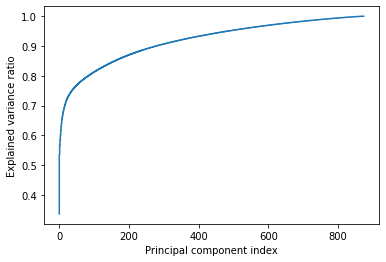

In [ ]:
pca = PCA()
pca.fit(X)

cum_sum_sv2 = np.cumsum(pca.explained_variance_ratio_)

plt.step(range(0,len(cum_sum_sv2)), cum_sum_sv2, label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.show()

pca = PCA(n_components = 20)
X_trim = pca.fit_transform(X)

Now we build a model based exclusively on the PCA features. This is a *much* lower dimensional problem. As we might expect (we gave up a non-trivial amount of information in X) performance suffers and our loss is now ~ 0.0174. Not so good by itself, but nonethless, the 'synthetic' features we created might help.   

In [ ]:
# Pure PCA => XGB
#Loss: 0.0174
X_pca = np.concatenate([X_trim, X[:,-2:]],axis=1)
losses_wPCA=[]
kf = KFold(n_splits=10)
for train_index, test_index in kf.split(X_pca):
    X_train, X_test = X_pca[train_index], X_pca[test_index]
    y_train, y_test = y[train_index], y[test_index]

    control_vehicle_mask = X_train[:,-2] == 0
    X_train = X_train[~control_vehicle_mask,:]
    y_train = y_train[~control_vehicle_mask]

    xgbclf.fit(X_train, y_train)

    preds = xgbclf.predict_proba(X_test) # list of preds per class
    preds = np.array(preds)[:,:,1].T

    control_mask = X_test[:,-2]==0
    preds[control_mask] = 0

    loss = log_loss(np.ravel(y_test), np.ravel(preds))
    print('Loss: '+str(loss))
    losses_wPCA.append(loss)

np.average(losses_wPCA)

PCA was not so good by itself; here we augment X with the 20-dimensional PCA feature we learned to see iof this heps improve performance. This is a common feature-engineering trick. It does help -- but just a tiny bit that is likely not statstically signfincant... the loss is now 0.01651 (as opposed to 0.01654 without the feature egineering).  

In [ ]:
# Pure PCA + Original features => XGB
# Loss: 0.0165123796877261
np.random.seed(1010)
X_combi = np.concatenate([X_trim, X], axis=1)
losses_combi=[]
kf = KFold(n_splits=10)
for train_index, test_index in kf.split(X_combi):
    X_train, X_test = X_combi[train_index], X_combi[test_index]
    y_train, y_test = y[train_index], y[test_index]

    control_vehicle_mask = X_train[:,-2] == 0
    X_train = X_train[~control_vehicle_mask,:]
    y_train = y_train[~control_vehicle_mask]

    xgbclf.fit(X_train, y_train)

    preds = xgbclf.predict_proba(X_test) # list of preds per class
    preds = np.array(preds)[:,:,1].T

    control_mask = X_test[:,-2]==0
    preds[control_mask] = 0

    loss = log_loss(np.ravel(y_test), np.ravel(preds))
    print('Loss: '+str(loss))
    losses_combi.append(loss)

np.average(losses_combi)

In [ ]:
# A convenient plotting function as we train models
def plot_hist(hist, last = None):
    if last == None:
        last = len(hist.history["loss"])
    plt.plot(hist.history["loss"][-last:])
    plt.plot(hist.history["val_loss"][-last:])
    plt.title("model accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epoch")
    plt.legend(["train", "validation"], loc="upper left")
    plt.show()

# **Neural Network Models**

We now transition to building NN mnodels. Such models have shown a great deal of promise w/ tabular data recently, and we will walk through a squence of increasingly complex models here. We start with the simplest possible NN -- logistic regression! Its worth noting that in the model below we regularize the parameters of the network (something we will drop later on). Another intersting point worth noting is that the model below optimizes the loss jointly over all the 206 components of $y$ as opposed to optimizing each individually. 

Another point of note is that we find these sorts of models far easier to customize and optimize over that the pre-packaged scikit models. 

In [ ]:
#Loss: 0.016719399391629967
def lr_model(input_shape, no_classes, lr):
    inputs = tf.keras.Input(shape=input_shape)
    outputs = layers.Dense(no_classes, activation='sigmoid', kernel_regularizer=regularizers.l2(1e-4))(inputs)
    model = tf.keras.Model(inputs, outputs)
    model.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate = lr), metrics=['binary_crossentropy'])
    return model

This performed remarkably well for a relatively simple model -- a loss of 0.01672. It was also a lot quicker than XGBoost. It also does not appear that we need to worry about the number of training epochs (as we would expect from the fact that we regularized).

In [ ]:
losses_lr=[]
kf = KFold(n_splits=10)
tf.random.set_seed(1010)
np.random.seed(1010)

for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    control_vehicle_mask = X_train[:,-2] == 0
    X_train = X_train[~control_vehicle_mask,:]
    y_train = y_train[~control_vehicle_mask]

    lrclf = lr_model((875,),206,0.01)
    hist = lrclf.fit(X_train, y_train, batch_size=2048, epochs=500, validation_data=(X_test, y_test), verbose=0)
    plot_hist(hist, last = 400)

    preds = lrclf.predict(X_test) # list of preds per class

    control_mask = X_test[:,-2]==0
    preds[control_mask] = 0
    loss =  log_loss(np.ravel(y_test), np.ravel(preds.astype(np.float64)))
    print('Loss: '+str(loss))
    losses_lr.append(loss)

np.average(losses_lr)

**A Single Hidden Layer**


Lets build something a bit more sophisticated. We introduce a single hidden layer. We're no longer regualizring here -- these networks benefit from over parametrization combined with early stopping. Dropout is crucial here -- it serves to effectively ensemble a large number of models. 

This already is as good as XGBoost -- *a loss of 0.01653*! And as you can see, it was *way* faster. 

In [ ]:
def l1_model(input_shape, no_classes, lr):
    inputs = tf.keras.Input(shape=input_shape)
    x = layers.Dense(128, activation='sigmoid')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(no_classes, activation='sigmoid')(x)
    model = tf.keras.Model(inputs, outputs)
    model.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate = lr), metrics=['binary_crossentropy'])
    return model

losses_NN=[]
kf = KFold(n_splits=10)
tf.random.set_seed(1010)
np.random.seed(1010)

for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    control_vehicle_mask = X_train[:,-2] == 0
    X_train = X_train[~control_vehicle_mask,:]
    y_train = y_train[~control_vehicle_mask]

    nnclf = l1_model((875,),206,0.0005)
    hist = nnclf.fit(X_train, y_train, batch_size=512, epochs=50, validation_data=(X_test, y_test), verbose=0)
    plot_hist(hist)

    preds = nnclf.predict(X_test) # list of preds per class

    control_mask = X_test[:,-2]==0
    preds[control_mask] = 0

    loss = log_loss(np.ravel(y_test), np.ravel(preds))
    print('Loss: '+str(loss))
    losses_NN.append(loss)

print('Average Loss: '+str(np.average(losses_NN))) 

If one layer worked so well, lets add a few more! Here we see three layers gives us a marked inmprovement over XGBoost -- our first attempt to actually improve on that model. Our OOS loss now stands at 0.0161. 


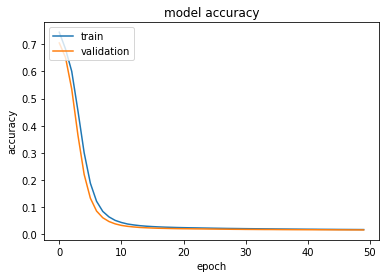

Loss: 0.016305196602818955


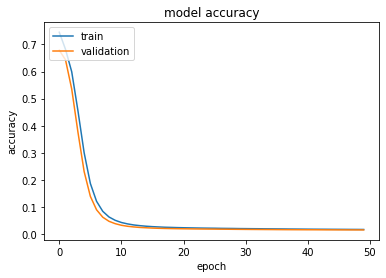

Loss: 0.015833487653719076


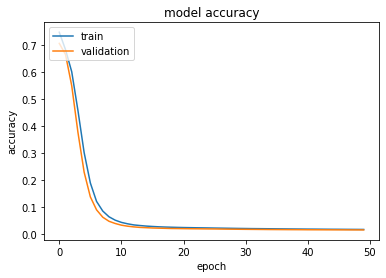

Loss: 0.015837833894625432


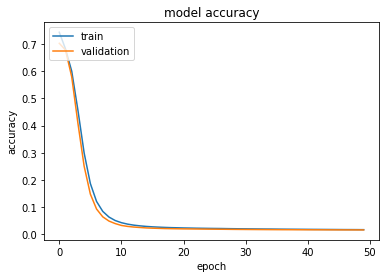

Loss: 0.01648212666529856


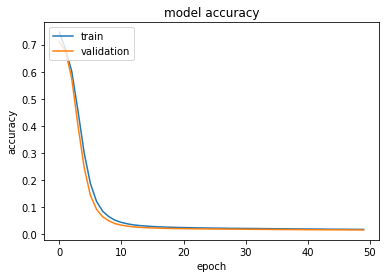

Loss: 0.015844475920518148


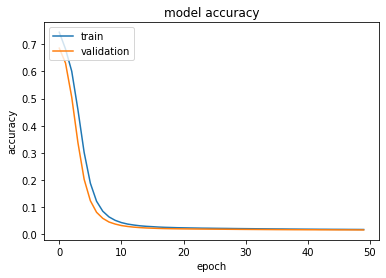

Loss: 0.01612653140399041


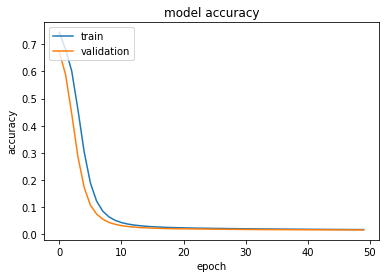

Loss: 0.01624833461467785


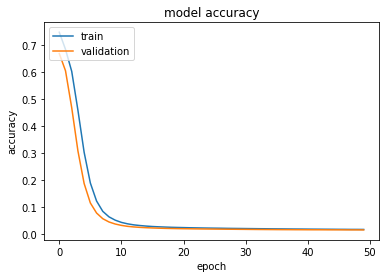

Loss: 0.015796698181485526


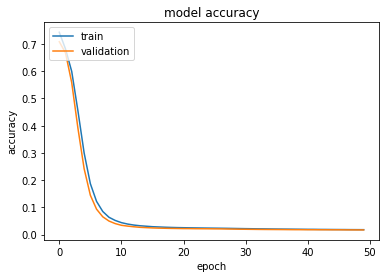

Loss: 0.016603472283572007


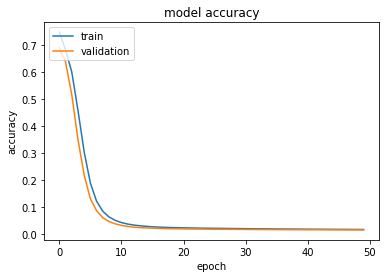

Loss: 0.016073030720974033
Average Loss: 0.016115118794168


In [ ]:
#0.0161
def l3_model(input_shape, no_classes, lr):
    inputs = tf.keras.Input(shape=input_shape)
    x = layers.Dense(128, activation='sigmoid')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(128, activation='sigmoid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
    x = layers.Dense(128, activation='sigmoid')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(no_classes, activation='sigmoid')(x)
    model = tf.keras.Model(inputs, outputs)
    model.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate = lr), metrics=['binary_crossentropy'])
    return model

losses_NN=[]
kf = KFold(n_splits=10)
tf.random.set_seed(1010)
np.random.seed(1010)

for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    control_vehicle_mask = X_train[:,-2] == 0
    X_train = X_train[~control_vehicle_mask,:]
    y_train = y_train[~control_vehicle_mask]

    nnclf = l3_model((875,),206,0.0005)
    hist = nnclf.fit(X_train, y_train, batch_size=512, epochs=50, validation_data=(X_test, y_test), verbose=0)
    plot_hist(hist)

    preds = nnclf.predict(X_test) # list of preds per class

    control_mask = X_test[:,-2]==0
    preds[control_mask] = 0

    loss = log_loss(np.ravel(y_test), np.ravel(preds))
    print('Loss: '+str(loss))
    losses_NN.append(loss)

print('Average Loss: '+str(np.average(losses_NN))) 

**Residual Connections**

Our final effort changes the architecture from being a simple feed forward network to adding resdiula connections. This can be viewed as a 'rollout' of the optimization that a boosting method might use. Specifically, consider builing a 'simple' model with a single hidden layer and then fitting another single model to the residual, and then another to the residual of the cobined models, and so forth.. Below, we do this three times. 

This model dramatically improves on XGBoost. Our loss stands at 0.0156! 



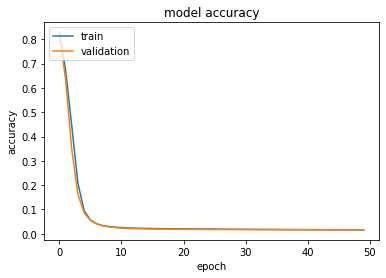

Loss: 0.015707593696274703


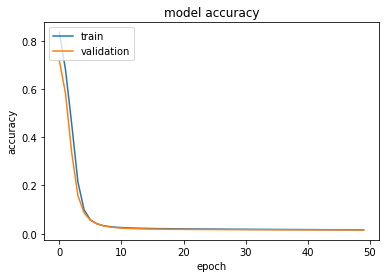

Loss: 0.01530901393287413


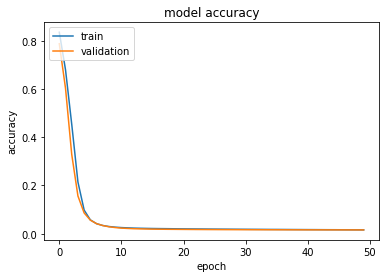

Loss: 0.01532653669452019


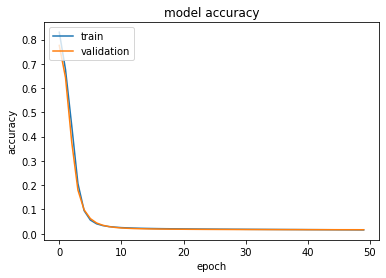

Loss: 0.01613887869233731


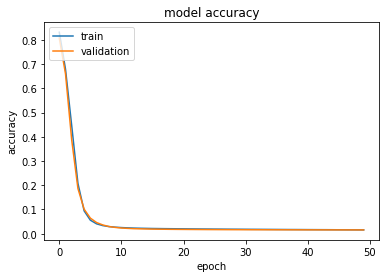

Loss: 0.015273691816722093


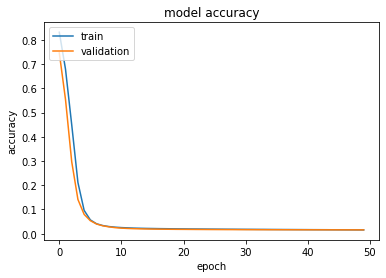

Loss: 0.015579915989931453


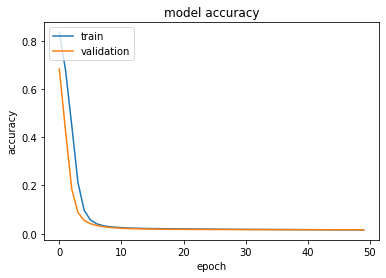

Loss: 0.01579605019505128


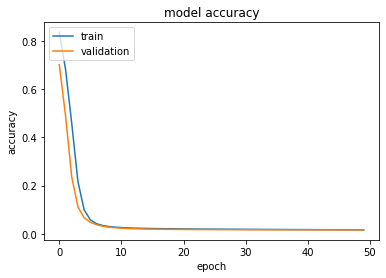

Loss: 0.015323377126737247


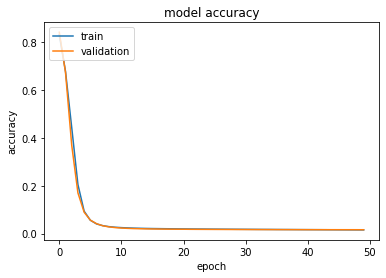

Loss: 0.016002061050048966


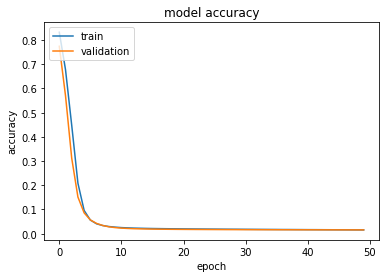

Loss: 0.015500260277728984
Average Loss: 0.015595737947222637


In [ ]:
#0.0156
def l3_res_model(input_shape, no_classes, lr):
    inputs = tf.keras.Input(shape=input_shape)
    x = layers.Dense(128, activation='sigmoid')(inputs)
    x = layers.BatchNormalization()(x)
    b_1 = layers.Dropout(0.2)(x)
    x = layers.Dense(128, activation='sigmoid')(b_1)
    x = layers.BatchNormalization()(x)
    b_2 = layers.Dropout(0.2)(x)
    x = layers.Dense(128, activation='sigmoid')(b_2)
    x = layers.BatchNormalization()(x)
    b_3 = layers.Dropout(0.2)(x)
    tot_op = tf.keras.layers.add([b_1, b_2, b_3])
    outputs = layers.Dense(no_classes, activation='sigmoid')(tot_op)
    model = tf.keras.Model(inputs, outputs)
    model.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate = lr), metrics=['binary_crossentropy'])
    return model


losses_NN=[]
kf = KFold(n_splits=10)
tf.random.set_seed(1010)
np.random.seed(1010)

for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    control_vehicle_mask = X_train[:,-2] == 0
    X_train = X_train[~control_vehicle_mask,:]
    y_train = y_train[~control_vehicle_mask]

    nnclf = l3_res_model((875,),206,0.0005)
    hist = nnclf.fit(X_train, y_train, batch_size=512, epochs=50, validation_data=(X_test, y_test), verbose=0)
    plot_hist(hist)

    preds = nnclf.predict(X_test) # list of preds per class

    control_mask = X_test[:,-2]==0
    preds[control_mask] = 0

    loss = log_loss(np.ravel(y_test), np.ravel(preds))
    print('Loss: '+str(loss))
    losses_NN.append(loss)

print('Average Loss: '+str(np.average(losses_NN))) 

# **What Next?**

Theres a whole bunch of things you can try from here:



*  A more sophisticated Neural Network architecture. Lately, [this architecture](https://arxiv.org/abs/1908.07442) has been shown to provide dramatic improvements over XGBoost. In fact, the architeure is very similalr to our final model above, but with the addition of 'attention' which effectively serves to restrict the number of times a given feature is used. A tensorflow implemtation is avaiable on pip.  
* Ensembling! One could argue that the final architecture we used (and indeed XGboost as well) are all ensembles. But it is routine to build a small number of different models and comboine their predcitions, either via a vote, or something more sophiosticated. 
* Low-dimensional strcture. We didnt really exploe this aspect of the data all that much. Can firther fetaure engineering help? What would LR + PCA do? 
* Data: We haven't really used all the data has to offer. For instance, we have not used the drug ids -- these may be useful for some sort of data normalization for instance. 

We suggest you try some of these -- or your own -- improvement ideas, and build a model that surpasses the last one we just built. 


